In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:

z_levels = [0.3, 0.6, 0.9]  # z-coordinates for hyperplanes

In [4]:

import numpy as np

In [5]:

z_levels=np.array(z_levels)

In [6]:
colors = ['red', 'green', 'blue']

In [20]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
import numpy as np

# Example: create random 3D points for nodes
num_nodes = 30
#np.random.seed(42)
points = np.random.rand(num_nodes, 2)

# Assign each point to a level based on HNSW assignment probabilities
# HNSW: P(level >= l) = exp(-l / mL), typically mL=1/log(M), use M=4 for demo
M = 2
mL = 1 / np.log(M)
levels = []
entry_point= None
for _ in range(num_nodes):
    l = 0
    while np.random.rand() < np.exp(-(l+1) / mL):
        l += 1
    levels.append(min(l, len(z_levels)-1))  # cap at max level
    if levels[-1] == len(z_levels) - 1:
        entry_point = _


# Assign z coordinate based on level
points3d = np.hstack([points, z_levels[levels][:,None]])


# Color points by their assigned level
point_colors = [colors[l] for l in levels]

# Assign each point to all levels up to its assigned level (inclusive)
point_levels = [list(range(l+1)) for l in levels]

# For visualization, plot each point at every level it belongs to
points3d = []
point_colors = []
for i, lvls in enumerate(point_levels):
    for l in lvls:
        points3d.append([points[i,0], points[i,1], z_levels[l]])
        point_colors.append(colors[l])
points3d = np.array(points3d)

In [110]:
query3d = np.array([[0.8, 0.8, x] for x in z_levels])  # Example query point

In [111]:
import heapq

def greedy_search_layer(query_point, entry_point, level):
    """
    Greedy search for upper layers (levels > 0).
    Returns only the closest point to serve as entry point for lower level.
    
    Args:
        query_point: 2D coordinates of the query point [x, y]
        entry_point: Single entry point index for this level
        level: Current level number
    
    Returns:
        closest_point: Index of the closest point found
        visited_path: List of points visited during search
    """
    def distance(p1, p2):
        return np.sqrt(np.sum((p1 - p2) ** 2))
    
    # Get all points available at this level
    level_points = [i for i in range(len(points)) if levels[i] >= level]
    
    if not level_points or entry_point not in level_points:
        return entry_point, []
    
    visited = set()
    visited_path = []
    
    current = entry_point
    current_dist = distance(query_point, points[current])
    
    while True:
        visited.add(current)
        visited_path.append(current)
        
        # Check neighbors for a closer point
        neighbors = get_neighbors_at_level(current, level_points)
        
        best_neighbor = None
        best_dist = current_dist
        
        for neighbor in neighbors:
            if neighbor not in visited:
                neighbor_dist = distance(query_point, points[neighbor])
                if neighbor_dist < best_dist:
                    best_dist = neighbor_dist
                    best_neighbor = neighbor
        
        # If no closer neighbor found, stop (local minimum reached)
        if best_neighbor is None:
            break
            
        current = best_neighbor
        current_dist = best_dist
    
    return current, visited_path

def search_layer_ef(query_point, entry_point, level, ef, num_closest=1):
    """
    Best-first search for level 0 with extended candidate list.
    
    Args:
        query_point: 2D coordinates of the query point [x, y]
        entry_point: Single entry point index for this level
        level: Current level number (typically 0)
        ef: Size of dynamic candidate list (> num_closest for better recall)
        num_closest: Number of closest points to return
    
    Returns:
        closest_points: List of closest point indices
        visited_path: List of points visited during search
    """
    def distance(p1, p2):
        return np.sqrt(np.sum((p1 - p2) ** 2))
    
    # Get all points available at this level
    level_points = [i for i in range(len(points)) if levels[i] >= level]
    
    if not level_points or entry_point not in level_points:
        return [entry_point] if entry_point in level_points else [], []
    
    visited = set()
    visited_path = []
    
    # Dynamic candidate list (min-heap by distance)
    candidates = []
    # Working list to track ef closest points (max-heap using negative distances)
    w = []
    
    # Initialize with single entry point
    entry_dist = distance(query_point, points[entry_point])
    heapq.heappush(candidates, (entry_dist, entry_point))
    heapq.heappush(w, (-entry_dist, entry_point))
    
    while candidates:
        current_dist, current = heapq.heappop(candidates)
        
        # If current is farther than farthest in w, stop (optimization)
        if len(w) >= ef and current_dist > -w[0][0]:
            break
            
        if current in visited:
            continue
            
        visited.add(current)
        visited_path.append(current)
        
        # Check neighbors
        neighbors = get_neighbors_at_level(current, level_points)
        
        for neighbor in neighbors:
            if neighbor not in visited:
                neighbor_dist = distance(query_point, points[neighbor])
                
                # Add to candidates for exploration
                heapq.heappush(candidates, (neighbor_dist, neighbor))
                
                # Update working list w
                if len(w) < ef:
                    heapq.heappush(w, (-neighbor_dist, neighbor))
                elif neighbor_dist < -w[0][0]:  # Closer than farthest in w
                    heapq.heapreplace(w, (-neighbor_dist, neighbor))
    
    # Extract closest points from w
    result_candidates = []
    while w:
        neg_dist, point_idx = heapq.heappop(w)
        result_candidates.append((point_idx, -neg_dist))
    
    result_candidates.sort(key=lambda x: x[1])  # Sort by distance
    closest_points = [idx for idx, _ in result_candidates[:num_closest]]
    
    return closest_points, visited_path

def get_neighbors_at_level(point_idx, available_points, max_connections=6):
    """
    Get neighbors of a point at a specific level.
    """
    if point_idx not in available_points:
        return []
    
    distances = []
    point_coords = points[point_idx]
    
    for other_idx in available_points:
        if other_idx != point_idx:
            other_coords = points[other_idx]
            dist = np.sqrt(np.sum((point_coords - other_coords) ** 2))
            distances.append((dist, other_idx))
    
    distances.sort()
    neighbors = [idx for _, idx in distances[:max_connections]]
    
    return neighbors

# Example HNSW search with single entry point
def hnsw_search(query_point, ef=50, num_closest=5):
    """
    Complete HNSW search algorithm with single entry point.
    """
    # Find entry point (random point from highest level)
    max_level = max(levels)
    
    all_paths = {}
    
    # Search from top level down to level 1 (greedy with single entry point)
    current_entry = entry_point
    for lev in range(max_level, 0, -1):
        closest, path = greedy_search_layer(query_point, current_entry, lev)
        all_paths[f'level_{lev}'] = path
        current_entry = closest  # Single closest point becomes entry for next level
    
    # Search level 0 with extended candidate list
    closest_points, path = search_layer_ef(query_point, current_entry, 0, ef, num_closest)
    all_paths['level_0'] = path
    
    return closest_points, all_paths

# Example usage
if len(points) > 0:
    query = np.array([0.8, 0.8])
    closest_points, search_paths = hnsw_search(query, ef=10, num_closest=3)
    
    print(f"Query point: {query}")
    print(f"Closest points found: {closest_points}")
    print(f"Search paths by level: {list(search_paths.keys())}")
    
    for level, path in search_paths.items():
        print(f"{level}: visited {len(path)} points - path: {path}")

Query point: [0.8 0.8]
Closest points found: [29, 17, 4]
Search paths by level: ['level_2', 'level_1', 'level_0']
level_2: visited 1 points - path: [27]
level_1: visited 2 points - path: [27, 29]
level_0: visited 6 points - path: [29, 17, 4, 10, 2, 25]


In [112]:
def build_path(query, ef, num_closest):
    search = hnsw_search(query, ef=ef, num_closest=num_closest)
    levels = sorted([x for x in search[1]])
    levels = levels[::-1]  # Reverse to start from highest level
    path = []
    for l in levels:
        level_num = int(l.split('_')[1])
        path.extend( (x, level_num) for x in  search[1][l])
    return path

In [113]:
build_path(query, ef=10, num_closest=3)

[(27, 2), (27, 1), (29, 1), (29, 0), (17, 0), (4, 0), (10, 0), (2, 0), (25, 0)]

In [121]:
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

def plot(fig, ax, path_progress):
    fig = fig or plt.figure(figsize=(10, 8))
    ax = ax or fig.add_subplot(111, projection='3d')

    sc = ax.scatter(points3d[:,0], points3d[:,1], points3d[:,2], c=point_colors, s=50)
    ax.plot(query3d[:,0], query3d[:,1], query3d[:,2], color='gray',ms=15, marker='X', label='Query Point')
    # Plot 3 parallel hyperplanes (levels) as filled rectangles with opacity
    for z, color in zip(z_levels, colors):
        # Define rectangle vertices
        vertices = [
            [-0.2, -0.2, z],
            [1.2, -0.2, z],
            [1.2, 1.2, z],
            [-0.2, 1.2, z]
        ]
        
        # Create filled polygon
        poly = [vertices]
        collection = Poly3DCollection(poly, alpha=0.1, facecolor=color, edgecolor=color)
        ax.add_collection3d(collection)

    # Draw vertical lines between corresponding points in each level
    for i in range(num_nodes):
        lvls = list(range(levels[i]+1))
        if len(lvls) > 1:
            xs = [points[i,0]] * len(lvls)
            ys = [points[i,1]] * len(lvls)
            zs = [z_levels[l] for l in lvls]
            ax.plot(xs, ys, zs, color='gray', alpha=0.5, linewidth=1)

    path = build_path(query, ef=10, num_closest=3)

    # Draw the search path with arrows
    path_points = []
    for point_idx, level in path:
        x, y = points[point_idx]
        z = z_levels[level]
        path_points.append([x, y, z])

    path_points = np.array(path_points)

    
    # Calculate which points to show based on progress
    if len(path_points) > 0 and path_progress > 0:
        total_segments = len(path_points) - 1
        progress_segments = path_progress * total_segments
        
        # Determine how many complete segments to show
        complete_segments = int(progress_segments)
        remaining_fraction = progress_segments - complete_segments
        
        # Build the visible path
        if complete_segments >= len(path_points) - 1:
            # Show full path
            visible_path = path_points
        else:
            # Show complete segments plus interpolated final point
            visible_path = path_points[:complete_segments + 1].copy()
            
            if remaining_fraction > 0 and complete_segments < len(path_points) - 1:
                # Interpolate the final point
                start_point = path_points[complete_segments]
                end_point = path_points[complete_segments + 1]
                interpolated_point = start_point + remaining_fraction * (end_point - start_point)
                visible_path = np.vstack([visible_path, interpolated_point])
        
        # Plot the visible portion of the path
        if len(visible_path) > 1:
            ax.plot(visible_path[:,0], visible_path[:,1], visible_path[:,2], 
                    color='black', linewidth=3, alpha=0.8, label='Search Path')
        
        # Highlight visited points with larger markers
        ax.scatter(visible_path[:,0], visible_path[:,1], visible_path[:,2], 
                c='black', s=100, marker='o', alpha=0.8, edgecolors='white', linewidth=2)
        
        # Add numbered annotations for path order
        for i, (x, y, z) in enumerate(visible_path):
            # Show fraction for interpolated points
            if i == len(visible_path) - 1 and remaining_fraction > 0 and complete_segments < len(path_points) - 1:
                label = f"{complete_segments + 1}.{int(remaining_fraction * 10)}"
            else:
                label = str(i + 1)
            
            ax.text(x, y, z, label, fontsize=10, color='white', 
                    bbox=dict(boxstyle="round,pad=0.3", facecolor='black', alpha=0.7))



    # Remove axis labels
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_zlabel('')


    ax.grid(False)

    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])
    ax.view_init(elev=20,azim=45)
    ax.xaxis.line.set_color((1.0, 1.0, 1.0, 0.0))
    ax.yaxis.line.set_color((1.0, 1.0, 1.0, 0.0))
    ax.zaxis.line.set_color((1.0, 1.0, 1.0, 0.0))

    plt.show()

    # Show the number of points at each level
    level_counts = [sum([l >= lvl for l in levels]) for lvl in range(len(z_levels))]
    for lvl, count in enumerate(level_counts):
        print(f"Level {lvl}: {count} points")

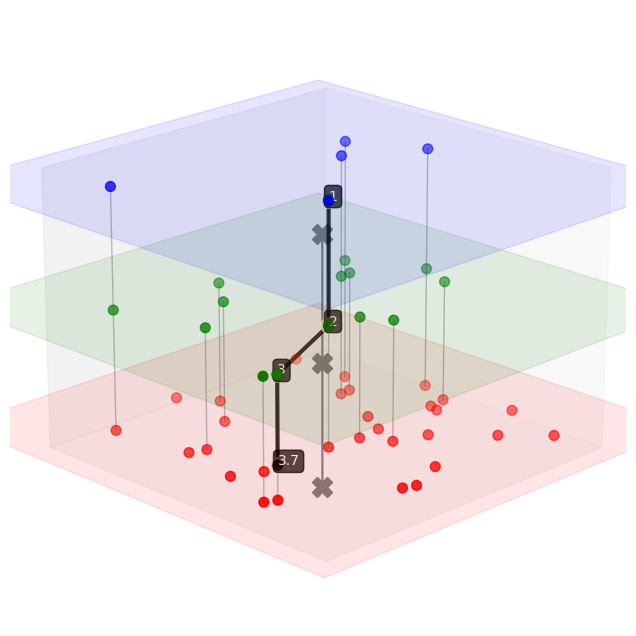

Level 0: 30 points
Level 1: 14 points
Level 2: 5 points


In [123]:
plot(None,None, 0.34)

In [ ]:
from matplotlib.animation import FuncAnimation
fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={'projection': '3d'})
FuncAnimation(fig, )

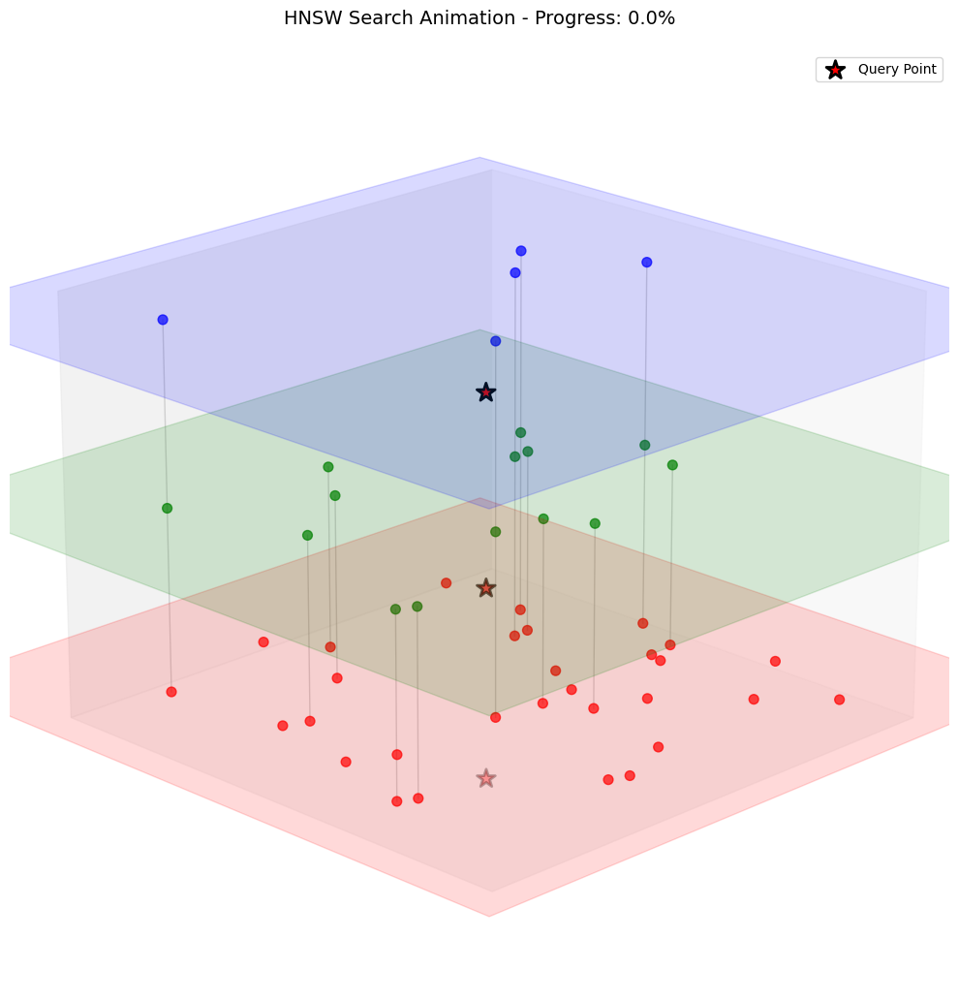

In [125]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def animate_hnsw_search(query, ef=10, num_closest=3, duration=5, fps=20):
    """
    Create an animated visualization of HNSW search
    
    Args:
        query: Query point coordinates
        ef: Exploration factor
        num_closest: Number of closest points to find
        duration: Animation duration in seconds
        fps: Frames per second
    """
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    # Calculate total frames
    total_frames = duration * fps
    
    def animate(frame):
        ax.clear()
        
        # Calculate progress (0 to 1)
        progress = frame / (total_frames - 1)
        
        # Plot base elements
        sc = ax.scatter(points3d[:,0], points3d[:,1], points3d[:,2], c=point_colors, s=50, alpha=0.7)
        ax.scatter(query3d[:,0], query3d[:,1], query3d[:,2], color='red', s=200, marker='*', 
                  label='Query Point', edgecolors='black', linewidth=2)
        
        # Plot 3 parallel hyperplanes (levels) as filled rectangles with opacity
        for z, color in zip(z_levels, colors):
            vertices = [
                [-0.2, -0.2, z],
                [1.2, -0.2, z],
                [1.2, 1.2, z],
                [-0.2, 1.2, z]
            ]
            poly = [vertices]
            collection = Poly3DCollection(poly, alpha=0.15, facecolor=color, edgecolor=color)
            ax.add_collection3d(collection)

        # Draw vertical lines between corresponding points in each level
        for i in range(num_nodes):
            lvls = list(range(levels[i]+1))
            if len(lvls) > 1:
                xs = [points[i,0]] * len(lvls)
                ys = [points[i,1]] * len(lvls)
                zs = [z_levels[l] for l in lvls]
                ax.plot(xs, ys, zs, color='gray', alpha=0.3, linewidth=1)

        # Get search path
        path = build_path(query, ef=ef, num_closest=num_closest)
        
        # Draw the search path with progress
        path_points = []
        for point_idx, level in path:
            x, y = points[point_idx]
            z = z_levels[level]
            path_points.append([x, y, z])

        path_points = np.array(path_points)
        
        # Calculate which points to show based on progress
        if len(path_points) > 0 and progress > 0:
            total_segments = len(path_points) - 1
            progress_segments = progress * total_segments
            
            # Determine how many complete segments to show
            complete_segments = int(progress_segments)
            remaining_fraction = progress_segments - complete_segments
            
            # Build the visible path
            if complete_segments >= len(path_points) - 1:
                # Show full path
                visible_path = path_points
            else:
                # Show complete segments plus interpolated final point
                visible_path = path_points[:complete_segments + 1].copy()
                
                if remaining_fraction > 0 and complete_segments < len(path_points) - 1:
                    # Interpolate the final point
                    start_point = path_points[complete_segments]
                    end_point = path_points[complete_segments + 1]
                    interpolated_point = start_point + remaining_fraction * (end_point - start_point)
                    visible_path = np.vstack([visible_path, interpolated_point])
            
            # Plot the visible portion of the path
            if len(visible_path) > 1:
                ax.plot(visible_path[:,0], visible_path[:,1], visible_path[:,2], 
                        color='black', linewidth=4, alpha=0.9, label='Search Path')
            
            # Highlight visited points with larger markers
            if len(visible_path) > 0:
                ax.scatter(visible_path[:-1,0], visible_path[:-1,1], visible_path[:-1,2], 
                        c='black', s=120, marker='o', alpha=0.9, edgecolors='white', linewidth=2)
                
                # Special marker for current position (last point)
                if len(visible_path) > 0:
                    current_pos = visible_path[-1]
                    ax.scatter([current_pos[0]], [current_pos[1]], [current_pos[2]], 
                            c='orange', s=150, marker='o', alpha=1.0, edgecolors='black', linewidth=3)
            
            # Add numbered annotations for visited points (not interpolated)
            for i in range(min(len(visible_path) - (1 if remaining_fraction > 0 else 0), len(path_points))):
                x, y, z = visible_path[i]
                ax.text(x, y, z, str(i + 1), fontsize=12, color='white', 
                        bbox=dict(boxstyle="round,pad=0.3", facecolor='black', alpha=0.8))

        # Styling
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.set_zlabel('')
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_zticks([])
        ax.view_init(elev=20, azim=45)
        ax.xaxis.line.set_color((1.0, 1.0, 1.0, 0.0))
        ax.yaxis.line.set_color((1.0, 1.0, 1.0, 0.0))
        ax.zaxis.line.set_color((1.0, 1.0, 1.0, 0.0))
        
        # Add title with progress
        ax.set_title(f'HNSW Search Animation - Progress: {progress:.1%}', fontsize=14, pad=20)
        
        # Add legend
        ax.legend(loc='upper right')
    
    # Create animation
    anim = FuncAnimation(fig, animate, frames=total_frames, interval=1000/fps, repeat=True)
    
    plt.tight_layout()
    return anim

# Create and display the animation
query = np.array([0.1, 0.1])
animation = animate_hnsw_search(query, ef=10, num_closest=3, duration=8, fps=15)

# To save as GIF (optional)
# animation.save('hnsw_search.gif', writer='pillow', fps=15)

# Display in notebook
HTML(animation.to_jshtml())